In [1]:
from src.simulator import Simulator
from src.parameters import ModelParameters, MPCParameters

from src.controller import PID, MPC, LinearReferenceMPC
from src.plotter import Plotter

In [2]:
import numpy as np
import matplotlib.pyplot as plt
%config InlineBackend.figure_formats = ['svg']

In [3]:
m1 = 0.5
m2 = 0.5
L1 = 0.5
L2 = 0.5
l2 = 0.5*L2
l1 = 0.5*L1
I1 = m1*l1**2
I2 = m2*l2**2

model_params_sim = ModelParameters

model_params_sim.m1 = m1
model_params_sim.m2 = m2
model_params_sim.L1 = L1
model_params_sim.L2 = L2
model_params_sim.l1 = l2
model_params_sim.l2 = l1
model_params_sim.I1 = I1
model_params_sim.I2 = I2

In [4]:
sim = Simulator(dt=0.01)
sim.set_model_params(model_parameters=model_params_sim)

## MPC

In [29]:
mpc_params = MPCParameters

mpc_params.N = 50
mpc_params.dt = 0.01
mpc_params.u_lim = 4
mpc_params.max_iter = 100

# Same model for simulator and controller
model_params_mpc = model_params_sim

mpc = LinearReferenceMPC()
mpc.set_controller_params(controller_parameters=mpc_params)
mpc.set_model_params(model_parameters=model_params_mpc)

### Simulation

In [30]:
x0 = [np.pi + 0.1, 0, 0.0, 0.0]
steps = 400

x_sim = np.ndarray((steps, 4))
x_sim[0] = x0

u_sim = np.ndarray(steps-1)

for i in range(steps-1):
  u_seq = mpc.update(x_sim[i])
  u = u_seq[0]
  #print(u)
  u_sim[i] = u
  
  x_sim[i+1] = sim.simulate_step(x=x_sim[i], u=u)

1.9908107574354457
1.1365480343467518
0.47367446327371265
-0.06172990609763437
-0.48783018995192196
-0.8104721265727739
-1.0429902876413542
-1.2050759190482077
-1.3147598560413432
-1.384496897030515
-1.4217317175336857
-1.4309560492201008
-1.415482852886379
-1.3785060991758884
-1.3235622940638885
-1.254615501984992
-1.1759458157414073
-1.0919505468150401
-1.0069098664883107
-0.9247384234807117
-0.8487406839643749
-0.7813991087478324
-0.7242345612810411
-0.6777741676861657
-0.6416399530200119
-0.6147405702804546
-0.5955228593101982
-0.582230695178477
-0.5731268699122771
-0.5666525712509647
-0.5615189629300338
-0.5567398519993789
-0.5516214201924767
-0.5457258154858129
-0.5388226256534284
-0.5308382047794353
-0.5218089692118207
-0.5118417612448859
-0.5010823205827403
-0.48969164580603763
-0.4778293636303625
-0.4656429369366868
-0.45326149020928347
-0.44079310623180334
-0.42832458799699424
-0.41592284627825854
-0.403637243839029
-0.3915023875440033
-0.3795410033785393
-0.3677666503522184


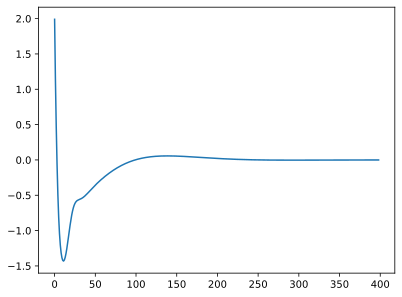

In [31]:
plt.plot(u_sim)

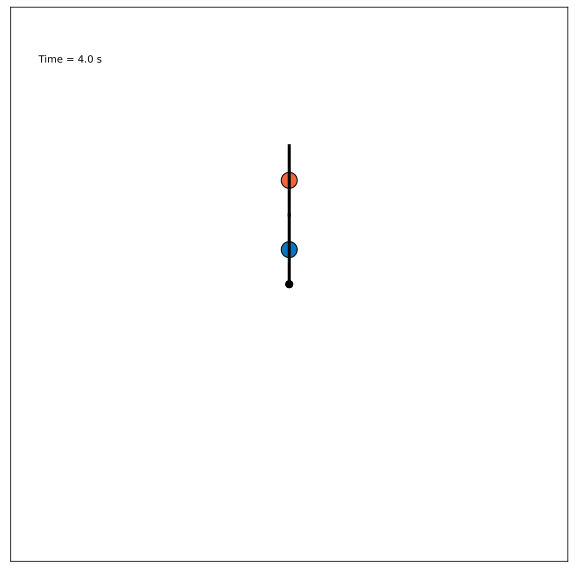

In [32]:
plotter = Plotter
plotter.animate_pendulum(x_sim[:,0], x_sim[:,1], model_params_sim.L1, model_params_sim.L2, dt=0.01)

## PID Controller

In [9]:
x0 = [3.14, 0, 0, 0]
steps = 400

x_sim = np.ndarray((steps, 4))
x_sim[0] = x0

u_sim = np.ndarray(steps)
e_sim = np.ndarray(steps)
de_sim = np.ndarray(steps)


controller = PID(Kp=100, Ki=0, Kd=-1)

reference = [np.pi, 0, 0, 0]

e_reference = 0
de_reference = 0


for i in range(steps-1):

  error = (reference[0] - x_sim[i, 0]) - (reference[1] - x_sim[i, 1])
  derror = de_reference - x_sim[i, 3]
  e_sim[i] = error
  de_sim[i] = derror
  
  u = controller.update(e=error, de=derror)
  u_sim[i] = u
  
  x_sim[i+1] = sim.simulate_step(x=x_sim[i], u=u)

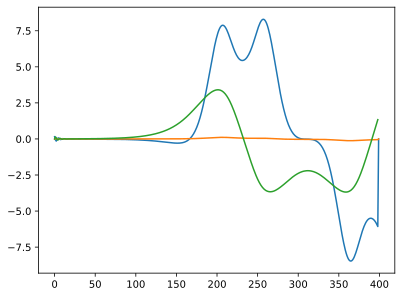

In [10]:
plt.plot(u_sim)
plt.plot(e_sim)
plt.plot(de_sim)

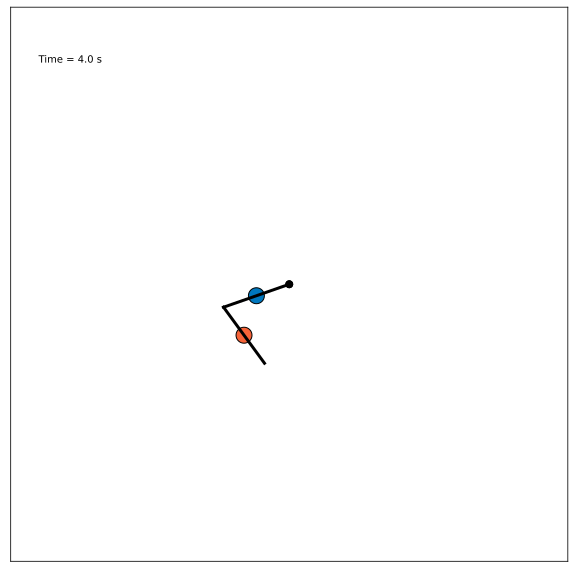

In [11]:
plotter = Plotter
plotter.animate_pendulum(x_sim[:,0], x_sim[:,1], model_params_sim.L1, model_params_sim.L2, dt=0.01)